# **Homework 3**

In [9]:
import numpy as np
import matplotlib.pyplot as plt
import torch
import torchvision
from torchvision import models, transforms
from torch import nn
import tarfile
from sklearn.metrics import roc_curve, auc
import numpy as np
import matplotlib.pyplot as plt
from tqdm import tqdm

### **Data Preparation**

In [15]:
#loading the dataset
from torchvision.datasets import ImageFolder
from torchvision.transforms import ToTensor
from torch.utils.data import DataLoader

#defining the dataset
dataset = ImageFolder(r"C:\Users\Vishantan\Desktop\Courses\Deep Learning\Homeworks\HW3\lfw", transform=ToTensor())

#defining the dataloader
dataloader = DataLoader(dataset, batch_size=64, shuffle=True)

In [16]:
# Load the pre-trained VGG-16 model
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
vgg16 = models.vgg16(pretrained=True).to(device)
vgg16.eval()

# Freeze all layers
for param in vgg16.features.parameters():
    param.requires_grad = False

# Function to extract features
def extract_features(data_loader, model):
    features = []
    labels = []
    with torch.no_grad():
        for images, targets in tqdm(data_loader, desc="Extracting Features", leave=False):
            images = images.to(device)
            output = model(images)
            # If the output layer has an adaptive pool or other layers, adjust here
            features.extend(output.cpu().detach().numpy())
            labels.extend(targets.numpy())
    return np.array(features), np.array(labels)

# Extract features
features, labels = extract_features(dataloader, vgg16)

# Compute pairwise cosine similarity
from sklearn.metrics.pairwise import cosine_similarity
similarity_matrix = cosine_similarity(features)

c:\Users\Vishantan\.conda\envs\DL\Lib\site-packages\torchvision\models\_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
c:\Users\Vishantan\.conda\envs\DL\Lib\site-packages\torchvision\models\_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=VGG16_Weights.IMAGENET1K_V1`. You can also use `weights=VGG16_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


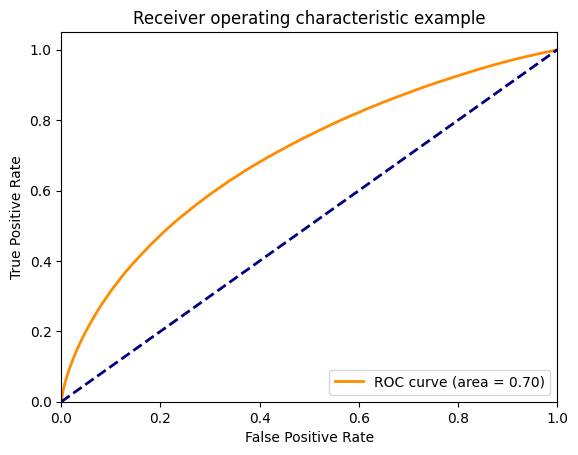

In [9]:

# Compute similarity scores and true labels for ROC curve
sim_scores = []
true_labels = []
num_classes = len(dataset.classes)
for i in range(len(labels)):
    for j in range(len(labels)):
        if i != j:
            sim_scores.append(similarity_matrix[i, j])
            true_labels.append(1 if labels[i] == labels[j] else 0)

# Compute ROC curve and ROC area
fpr, tpr, _ = roc_curve(true_labels, sim_scores)
roc_auc = auc(fpr, tpr)

# Plot ROC curve
plt.figure()
lw = 2
plt.plot(fpr, tpr, color='darkorange', lw=lw, label='ROC curve (area = %0.2f)' % roc_auc)
plt.plot([0, 1], [0, 1], color='navy', lw=lw, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver operating characteristic example')
plt.legend(loc="lower right")
plt.show()

### **Fine-Tuning**

#### **(i) AlexNet** 

In [4]:
#Using pre-trained AlexNet model
model = torchvision.models.alexnet(pretrained=True)

#freezing the model
for param in model.parameters():
    param.requires_grad = False


c:\Users\Vishantan\AppData\Local\Programs\Python\Python311\Lib\site-packages\torchvision\models\_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
c:\Users\Vishantan\AppData\Local\Programs\Python\Python311\Lib\site-packages\torchvision\models\_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=AlexNet_Weights.IMAGENET1K_V1`. You can also use `weights=AlexNet_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


In [5]:
#Fine-tuning the model
model.classifier[6] = torch.nn.Linear(4096, len(dataset.classes))

#defining the loss function
loss_fn = torch.nn.CrossEntropyLoss()

#defining the optimizer
optimizer = torch.optim.Adam(model.parameters(), lr=3e-4)

#training the model
n_epochs = 5
for epoch in range(n_epochs):
    for imgs, labels in dataloader:
        outputs = model(imgs)
        loss = loss_fn(outputs, labels)
        
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()
        
    print(f"Epoch {epoch} Loss: {float(loss)}")

#saving the model
torch.save(model.state_dict(), "model.pth")
print("Model saved successfully")

Epoch 0 Loss: 8.744891166687012
Epoch 1 Loss: 3.9008941650390625
Epoch 2 Loss: 2.474879741668701
Epoch 3 Loss: 1.8938992023468018
Epoch 4 Loss: 1.5231456756591797
Model saved successfully


In [6]:
#loading the model
#model = torchvision.models.alexnet()
#model.load_state_dict(torch.load("model.pth"))
model.eval()

#testing the model
imgs, labels = next(iter(dataloader))
outputs = model(imgs)
_, preds = outputs.max(1)

In [16]:
preds

tensor([1548, 1898,  718,  401, 1015,  472, 1272, 3856,  484, 2246, 4469, 2623,
        4717, 4427, 1879, 4924, 2852, 1740, 4828, 2107, 1871, 3003, 4131, 2480,
        1892,  856, 2175, 5600, 4153,  620,  245, 4507, 5437, 5615, 4295, 1766,
         322, 2704, 3202, 5679, 4089, 4457, 2402, 1871, 2941, 1755, 2687, 1788,
        1442, 2782, 2136, 4898, 4127, 2738, 1871, 3202, 1304, 1744, 2506, 4224,
        4836,  788, 4349,  411])

In [17]:
labels

tensor([1548, 1898, 5363,  401, 1015,  472, 1272, 3856,  484, 5039, 4469, 2623,
        4717, 4427, 4721, 4924, 2852, 1740, 4828, 2107, 1871, 3003, 2526, 2480,
        2155, 4836, 2175, 2884, 4153,  620,  245, 4507, 5437, 5615, 4295, 1766,
         322, 2704, 3202, 5679, 4089, 4457, 2402, 1871, 2941, 1755, 1404, 1788,
        1442, 3756, 2136, 4898, 4127, 2738, 4592, 3202, 5408, 5458, 2506, 4224,
        4878,  788, 2468,  411])

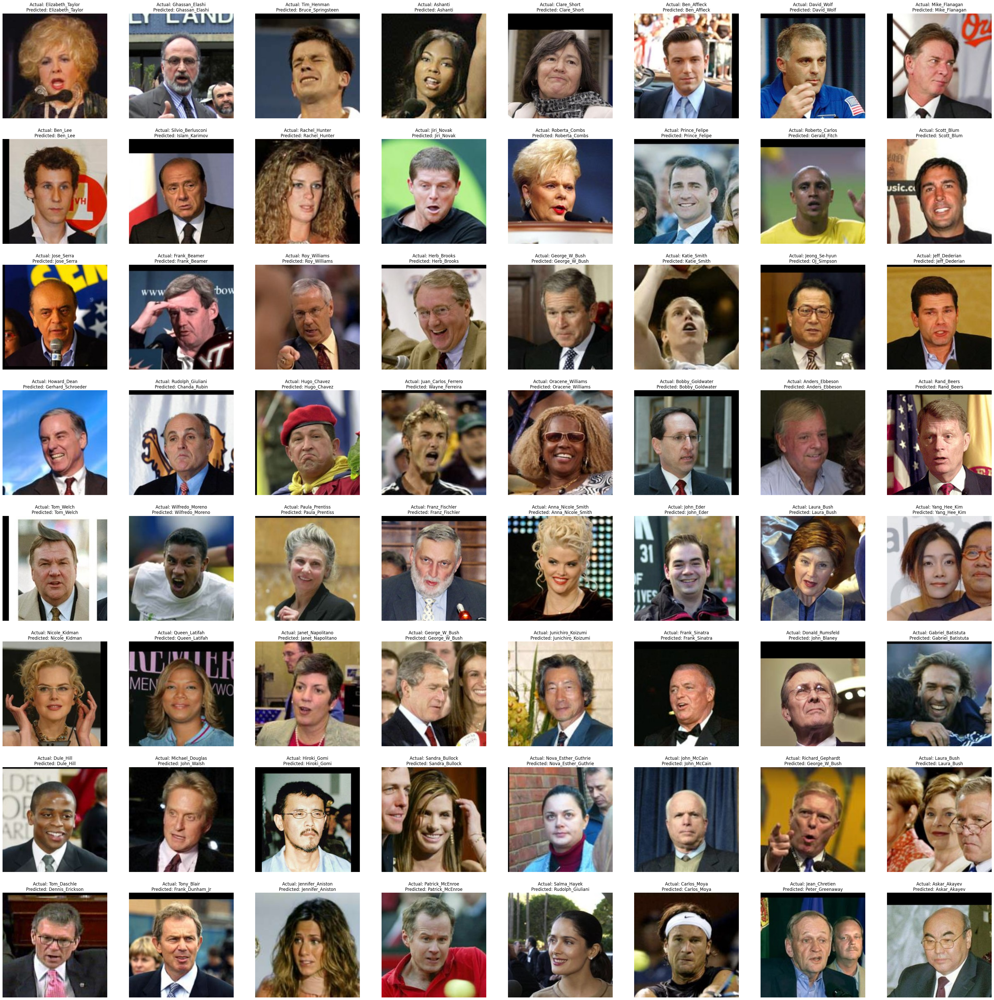

Accuracy: 0.78125


In [7]:

#plotting the images
fig, ax = plt.subplots(8, 8, figsize=(50, 50))
for i in range(64):
    ax[i//8, i%8].imshow(imgs[i].permute(1, 2, 0))
    ax[i//8, i%8].set_title(f"Actual: {dataset.classes[labels[i]]}\nPredicted: {dataset.classes[preds[i]]}")
    ax[i//8, i%8].axis("off")
plt.show()

#calculating the accuracy
accuracy = (preds == labels).float().mean()
print(f"Accuracy: {accuracy}")



In [8]:
#Plotting ROC curve
from sklearn.metrics import roc_curve, auc
from sklearn.preprocessing import label_binarize
from sklearn.metrics import roc_auc_score

#defining the function to plot the ROC curve
def plot_roc_curve(y_true, y_score, n_classes):
    fpr = dict()
    tpr = dict()
    roc_auc = dict()
    
    for i in range(n_classes):
        fpr[i], tpr[i], _ = roc_curve(y_true[:, i], y_score[:, i])
        roc_auc[i] = auc(fpr[i], tpr[i])
    
    plt.figure()
    lw = 2
    colors = ['aqua', 'darkorange', 'cornflowerblue']
    for i in range(n_classes):
        plt.plot(fpr[i], tpr[i], color=colors[i], lw=lw, label=f'ROC curve of class {i} (area = {roc_auc[i]:.2f})')
    
    plt.plot([0, 1], [0, 1], color='navy', lw=lw, linestyle='--')
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title('Receiver Operating Characteristic')
    plt.legend(loc="lower right")
    plt.show()

#defining the function to calculate the ROC AUC score
def calculate_roc_auc_score(y_true, y_score, n_classes):
    y_true = label_binarize(y_true, classes=[0, 1, 2])
    roc_auc = roc_auc_score(y_true, y_score, average='macro')
    return roc_auc

#defining the function to calculate the confusion matrix
def calculate_confusion_matrix(y_true, y_pred, n_classes):
    confusion_matrix = np.zeros((n_classes, n_classes))
    for i in range(len(y_true)):
        confusion_matrix[y_true[i], y_pred[i]] += 1
    return confusion_matrix

#defining the function to calculate the precision, recall and f1 score
def calculate_precision_recall_f1_score(y_true, y_pred, n_classes):
    precision = np.zeros(n_classes)
    recall = np.zeros(n_classes)
    f1_score = np.zeros(n_classes)
    for i in range(n_classes):
        tp = np.sum((y_true == i) & (y_pred == i))
        fp = np.sum((y_true != i) & (y_pred == i))
        fn = np.sum((y_true == i) & (y_pred != i))
        precision[i] = tp / (tp + fp)
        recall[i] = tp / (tp + fn)
        f1_score[i] = 2 * precision[i] * recall[i] / (precision[i] + recall[i])
    return precision, recall, f1_score

#defining the function to calculate the accuracy
def calculate_accuracy(y_true, y_pred):
    accuracy = np.mean(y_true == y_pred)
    return accuracy

#defining the function to calculate the metrics
def calculate_metrics(y_true, y_pred, y_score, n_classes):
    roc_auc_score = calculate_roc_auc_score(y_true, y_score, n_classes)
    confusion_matrix = calculate_confusion_matrix(y_true, y_pred, n_classes)
    precision, recall, f1_score = calculate_precision_recall_f1_score(y_true, y_pred, n_classes)
    accuracy = calculate_accuracy(y_true, y_pred)
    return roc_auc_score, confusion_matrix, precision, recall, f1_score, accuracy

In [10]:
# calculating the metrics
n_classes = len(dataset.classes)
y_true = labels.numpy()
y_pred = preds.numpy()
y_score = outputs.detach().numpy()
roc_auc_score, confusion_matrix, precision, recall, f1_score, accuracy = calculate_metrics(y_true, y_pred, y_score, n_classes)

#plotting the ROC curve
y_true = label_binarize(y_true, classes=[0, 1])
plot_roc_curve(y_true, y_score, n_classes)

#displaying the metrics
print(f"ROC AUC Score: {roc_auc_score}")
print(f"Confusion Matrix:\n{confusion_matrix}")
print(f"Precision: {precision}")
print(f"Recall: {recall}")
print(f"F1 Score: {f1_score}")
print(f"Accuracy: {accuracy}")

#Plotting the confusion matrix
import seaborn as sns
plt.figure(figsize=(10, 7))
sns.heatmap(confusion_matrix, annot=True, fmt=".0f", cmap="Blues")
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.title("Confusion Matrix")
plt.show()

ValueError: Only one class present in y_true. ROC AUC score is not defined in that case.

In [12]:
labels

tensor([1548, 1898, 5363,  401, 1015,  472, 1272, 3856,  484, 5039, 4469, 2623,
        4717, 4427, 4721, 4924, 2852, 1740, 4828, 2107, 1871, 3003, 2526, 2480,
        2155, 4836, 2175, 2884, 4153,  620,  245, 4507, 5437, 5615, 4295, 1766,
         322, 2704, 3202, 5679, 4089, 4457, 2402, 1871, 2941, 1755, 1404, 1788,
        1442, 3756, 2136, 4898, 4127, 2738, 4592, 3202, 5408, 5458, 2506, 4224,
        4878,  788, 2468,  411])